In [3]:
import numpy as np
import pandas as pd
import scipy.spatial as sp
import scipy.interpolate as snt
import biocircuits
import tqdm
from math import ceil

import colorcet as cc
import holoviews as hv
import bokeh.io
import bokeh.plotting
import bokeh_catplot

from datetime import date

hv.extension('matplotlib')
bokeh.io.output_notebook()

colors = cc.palette.glasbey_category10
ceiling = np.vectorize(ceil)
sample_cycle = lambda cycle, size: [cycle[i] for i in ceiling(np.linspace(0, len(cycle) - 1, size))]

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

Loading BokehJS ...

In [4]:
%run lattice_signaling.py
%run lattice_oop.py

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

All lattice_signaling.py functions imported.


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

All lattice_signaling.py functions imported.


In [5]:
%load_ext blackcellmagic

<hr>

In [13]:
def ddeint_1D(
    dde_rhs,
    E0,
    t_out,
    delays,
    I_t,
    n_cells,
    dde_args=(),
    n_time_points_per_step=20,
    progress_bar=False,
):
    """Solve a delay differential equation on a growing lattice of cells."""
    
    assert all([delay > 0 for delay in delays]), "Non-positive delays are not permitted."

    t0 = t_out[0]
    t_last = t_out[-1]

    # Extract shortest and longest non-zero delay parameters
    min_tau = min(delays)

    # Calculate graph adjacency matrix
    A = np.diag((1,) * (n_cells - 1), -1) + np.diag((1,) * (n_cells - 1), 1)
    
    # Make a shorthand for RHS function
    def rhs(E, t, E_past):
        return dde_rhs(
            E,
            t,
            E_past,
            I_t=I_t,
            A=A,
            delays=delays,
            params=dde_args,
        )

    # Define a piecewise function to fetch past values of E
    time_bins = [t0]
    E_past_funcs = [lambda t, *args: E0(t, I_t=I_t, n_cells=n_cells)]

    def E_past(t):
        """Define past expression as a piecewise function."""
        bin_idx = next((i for i, t_bin in enumerate(time_bins) if t < t_bin))
        return E_past_funcs[bin_idx](t)

    # Initialize expression.
    E = E0(t0, I_t=I_t, n_cells=n_cells)

    t_dense = []
    E_dense = []
    
    # Integrate in steps of size min_tau. Stops before the last step.
    t_step = np.linspace(t0, t0 + min_tau, n_time_points_per_step + 1)
    n_steps = ceil((t_out[-1] - t0) / min_tau)
    
    iterator = range(n_steps)
    if progress_bar:
        iterator = tqdm.tqdm(iterator)
        
    for j in iterator:

        # Start the next step
        E_step = [E]

        # Perform integration
        for i, t in enumerate(t_step[:-1]):
            dE_dt = rhs(E, t, E_past)
            dt = t_step[i + 1] - t
            E = np.maximum(E + dE_dt * dt, 0)
            E_step.append(E)
        
        t_dense = t_dense + list(t_step[:-1])
        E_dense = E_dense + E_step[:-1]
        
        # Make B-spline
        E_step = np.array(E_step)
        tck = [
            [snt.splrep(t_step, E_step[:, cell, i]) for i in range(E.shape[1])]
            for cell in range(n_cells)
        ]

        # Append spline interpolation to piecewise function
        time_bins.append(t_step[-1])
        interp = lambda t, k=j + 1: np.array(
            [
                [np.maximum(snt.splev(t, tck[cell][i]), 0) for i in range(E.shape[1])]
                for cell in range(n_cells)
            ]
        )
        E_past_funcs.append(interp)

        # Get time-points for next step
        t_step += min_tau
        
        # Make the last step end at t_last
        if t_step[-1] > t_last:
            t_step = np.concatenate((t_step[t_step < t_last], (t_last,),))

    # Add data for last time-point
    t_dense = t_dense + [t_last]
    E_dense = E_dense + [E]

    # Interpolate solution for returning
    t_dense = np.array(t_dense)
    E_dense = np.array(E_dense)
    
    E_return = np.empty((len(t_out), *E.shape))
    for cell in range(E.shape[0]):
        for i in range(E.shape[1]):
            tck = snt.splrep(t_dense, E_dense[:, cell, i])
            E_return[:, cell, i] = np.maximum(snt.splev(t_out, tck), 0)

    return t_dense, E_dense, E_return

In [14]:
def rhs_tc_delay_cis_1D(E, t, E_past, I_t, A, delays, params):
    
    tau = delays[0]
    alpha, k_s, p_s, delta = params
    
    # Get the signal input E_bar to each cell after a delay tau
    E_tau = E_past(t - tau)
    E_bar = np.dot(A, E_tau)

    # Evaluate Hill term with cis-inhibition
    f = biocircuits.reg.act_hill(E_bar / (k_s + delta * E_tau), p_s)
    
    # Calculate change in expression
    dE_dt = alpha * f - E
    dE_dt[0, :] = I_t(t) - E[0, :]
        
    return dE_dt

In [15]:
def E0(t, I_t, n_cells): 
    E = np.zeros((n_cells, 1))
    E[0, :] = I_t(t)
    return E

In [16]:
alpha = 2
k_s = 0.001
p_s = 2
delta = 10
tau = 0.4

params = alpha, k_s, p_s, delta
delays = (tau,)

In [17]:
t_results = np.linspace(0, 8, 200)
n_cells=10

t_dense, E_dense, results = ddeint_1D(
    dde_rhs=rhs_tc_delay_cis_1D,
    E0=E0,
    t_out=t_results,
    delays=delays,
    I_t=I_t,
    n_cells=n_cells,
    dde_args=params,
    n_time_points_per_step=200,
    progress_bar=False,
)

In [18]:
data = pd.DataFrame(
    {
        "step": np.repeat(np.arange(t_results.size), n_cells),
        "time": np.repeat(t_results, n_cells),
        "cell": np.array(
            [
                "cell_" + str(i).zfill(3)
                for i in np.tile(np.arange(n_cells), t_results.size)
            ]
        ),
        "expression": results.flatten(),
    }
)

:NdOverlay   [cell]
   :Curve   [time]   (expression,cell)
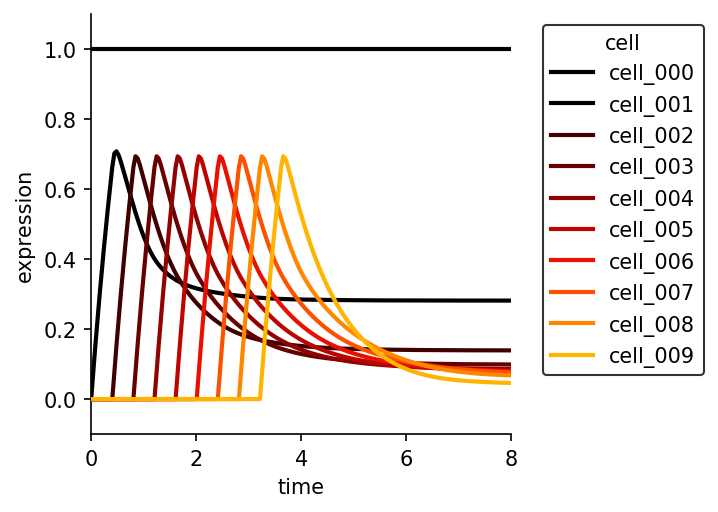

In [19]:
color_cycle = hv.Cycle(['black'] + cc.fire[::25])

plt = hv.Curve(
    data=data,
    kdims=['time'],
    vdims=["expression", "cell"]
).groupby(
    "cell"
).opts(
    hv.opts.Curve(color=color_cycle),
).overlay().opts(legend_position="right", )

hv.output(plt, dpi=150)

Do a quantification of this somehow? Or make more grid-plots.

<hr>

In [64]:
%run lattice_oop.py

In [65]:
def ddeint_2D(
    dde_rhs,
    E0,
    t_out,
    delays,
    I_t,
    lattice,
    dde_args=(),
    n_time_points_per_step=20,
    progress_bar=False,
):
    """Solve a delay differential equation on a growing lattice of cells."""
    
    assert all([delay > 0 for delay in delays]), "Non-positive delays are not permitted."

    t0 = t_out[0]
    t_last = t_out[-1]

    # Extract shortest and longest non-zero delay parameters
    min_tau = min(delays)

    # Get graph transition matrix 
    A = lattice.transition_mtx()
    
    # Make a shorthand for RHS function
    def rhs(E, t, E_past):
        return dde_rhs(
            E,
            t,
            E_past,
            I_t=I_t,
            A=A,
            delays=delays,
            params=dde_args,
        )

    # Define a piecewise function to fetch past values of E
    time_bins = [t0]
    E_past_funcs = [lambda t, *args: E0(t, I_t=I_t, n_cells=lattice.n_cells())]

    def E_past(t):
        """Define past expression as a piecewise function."""
        bin_idx = next((i for i, t_bin in enumerate(time_bins) if t < t_bin))
        return E_past_funcs[bin_idx](t)

    # Initialize expression.
    E = E0(t0, I_t=I_t, n_cells=lattice.n_cells())

    t_dense = []
    E_dense = []
    
    # Integrate in steps of size min_tau. Stops before the last step.
    t_step = np.linspace(t0, t0 + min_tau, n_time_points_per_step + 1)
    n_steps = ceil((t_out[-1] - t0) / min_tau)
    
    iterator = range(n_steps)
    if progress_bar:
        iterator = tqdm.tqdm(iterator)
        
    for j in iterator:

        # Start the next step
        E_step = [E]

        # Perform integration
        for i, t in enumerate(t_step[:-1]):
            dE_dt = rhs(E, t, E_past)
            dt = t_step[i + 1] - t
            E = np.maximum(E + dE_dt * dt, 0)
            E_step.append(E)
        
        t_dense = t_dense + list(t_step[:-1])
        E_dense = E_dense + E_step[:-1]
        
        # Make B-spline
        E_step = np.array(E_step)
        tck = [
            [snt.splrep(t_step, E_step[:, cell, i]) for i in range(E.shape[1])]
            for cell in range(lattice.n_cells())
        ]

        # Append spline interpolation to piecewise function
        time_bins.append(t_step[-1])
        interp = lambda t, k=j + 1: np.array(
            [
                [np.maximum(snt.splev(t, tck[cell][i]), 0) for i in range(E.shape[1])]
                for cell in range(lattice.n_cells())
            ]
        )
        E_past_funcs.append(interp)

        # Get time-points for next step
        t_step += min_tau
        
        # Make the last step end at t_last
        if t_step[-1] > t_last:
            t_step = np.concatenate((t_step[t_step < t_last], (t_last,),))

    # Add data for last time-point
    t_dense = t_dense + [t_last]
    E_dense = E_dense + [E]

    # Interpolate solution for returning
    t_dense = np.array(t_dense)
    E_dense = np.array(E_dense)
    
    E_return = np.empty((len(t_out), *E.shape))
    for cell in range(E.shape[0]):
        for i in range(E.shape[1]):
            tck = snt.splrep(t_dense, E_dense[:, cell, i])
            E_return[:, cell, i] = np.maximum(snt.splev(t_out, tck), 0)

    return t_dense, E_dense, E_return

In [66]:
lax2d = Regular2DLattice(R = 10)

In [67]:
def rhs_tc_delay_cis_2D(E, t, E_past, I_t, A, delays, params):
    
    tau = delays[0]
    alpha, k_s, p_s, delta = params
    
    # Get the signal input E_bar to each cell after a delay tau
    E_tau = E_past(t - tau)
    E_bar = np.dot(A, E_tau)

    # Evaluate Hill term with cis-inhibition
    f = biocircuits.reg.act_hill(E_bar / (k_s + delta * E_tau), p_s)
    
    # Calculate change in expression
    dE_dt = alpha * f - E
    dE_dt[0, :] = I_t(t) - E[0, :]
        
    return dE_dt

In [71]:
def E0(t, I_t, n_cells): 
    E = np.zeros((n_cells, 1))
    E[0, :] = I_t(t)
    return E

def I_t(t): return 1

In [72]:
alpha = 2
k_s = 0.001
p_s = 2
delta = 10
tau = 0.4

params = alpha, k_s, p_s, delta
delays = (tau,)

In [73]:
t_results = np.linspace(0, 8, 200)

t_dense, E_dense, results = ddeint_2D(
    dde_rhs=rhs_tc_delay_cis_2D,
    E0=E0,
    t_out=t_results,
    delays=delays,
    I_t=I_t,
    lattice=lax2d,
    dde_args=params,
    n_time_points_per_step=200,
    progress_bar=True,
)

100%|██████████| 20/20 [00:20<00:00,  1.01s/it]


In [74]:
axis_cells = np.argwhere((lax2d.X[:, 1] == 0) & (lax2d.X[:, 0] >= 0)).flatten()
axis_results = results[:, axis_cells, :]

data2d = pd.DataFrame(
    {
        "step": np.repeat(np.arange(t_results.size), axis_cells.size),
        "time": np.repeat(t_results, axis_cells.size),
        "cell": np.array(
            [
                "cell_" + str(i).zfill(3)
                for i in np.tile(axis_cells, t_results.size)
            ]
        ),
        "expression": axis_results.flatten(),
    }
)

:NdOverlay   [cell]
   :Curve   [time]   (expression,cell)
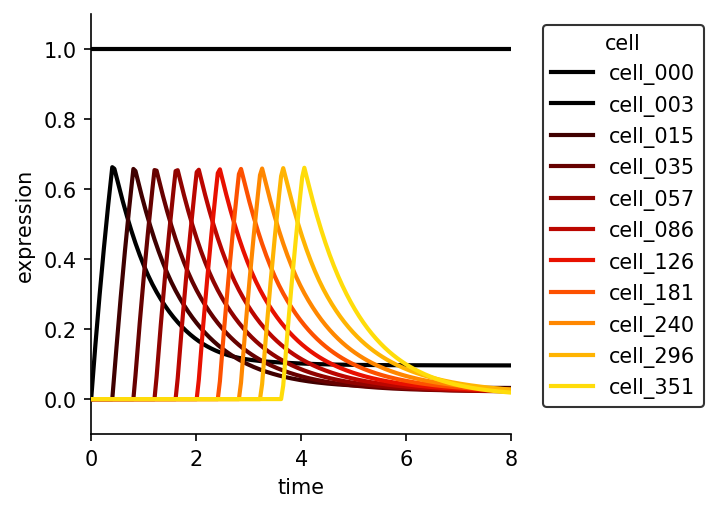

In [75]:
color_cycle = hv.Cycle(['black'] + cc.fire[::25])

plt = hv.Curve(
    data=data2d,
    kdims=['time'],
    vdims=["expression", "cell"]
).groupby(
    "cell"
).opts(
    hv.opts.Curve(color=color_cycle),
).overlay().opts(legend_position="right", )

hv.output(plt, dpi=150)

Very. Cool.

In [76]:
alpha = 2
k_s = 0.001
p_s = 2
delta = 2
tau = 0.4

params = alpha, k_s, p_s, delta
delays = (tau,)

In [77]:
t_results = np.linspace(0, 8, 200)

t_dense, E_dense, results = ddeint_2D(
    dde_rhs=rhs_tc_delay_cis_2D,
    E0=E0,
    t_out=t_results,
    delays=delays,
    I_t=I_t,
    lattice=lax2d,
    dde_args=params,
    n_time_points_per_step=100,
    progress_bar=True,
)

100%|██████████| 20/20 [00:11<00:00,  1.71it/s]


In [78]:
axis_cells = np.argwhere((lax2d.X[:, 1] == 0) & (lax2d.X[:, 0] >= 0)).flatten()
axis_results = results[:, axis_cells, :]

data2d = pd.DataFrame(
    {
        "step": np.repeat(np.arange(t_results.size), axis_cells.size),
        "time": np.repeat(t_results, axis_cells.size),
        "cell": np.array(
            [
                "cell_" + str(i).zfill(3)
                for i in np.tile(axis_cells, t_results.size)
            ]
        ),
        "expression": axis_results.flatten(),
    }
)

:NdOverlay   [cell]
   :Curve   [time]   (expression,cell)
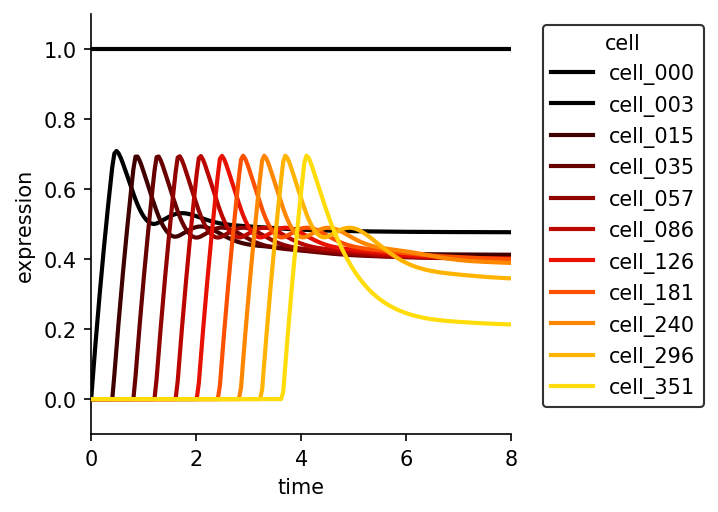

In [79]:
color_cycle = hv.Cycle(['black'] + cc.fire[::25])

plt = hv.Curve(
    data=data2d,
    kdims=['time'],
    vdims=["expression", "cell"]
).groupby(
    "cell"
).opts(
    hv.opts.Curve(color=color_cycle),
).overlay().opts(legend_position="right", )

hv.output(plt, dpi=150)

In [80]:
def rhs_tc_delay_cis_2D_nosender(E, t, E_past, I_t, A, delays, params):
    
    tau = delays[0]
    alpha, k_s, p_s, delta = params
    
    # Get the signal input E_bar to each cell after a delay tau
    E_tau = E_past(t - tau)
    E_bar = np.dot(A, E_tau)

    # Evaluate Hill term with cis-inhibition
    f = biocircuits.reg.act_hill(E_bar / (k_s + delta * E_tau), p_s)
    
    # Calculate change in expression
    dE_dt = alpha * f - E
#     dE_dt[0, :] = I_t(t) - E[0, :]
        
    return dE_dt

In [81]:
alpha = 2
k_s = 0.05
p_s = 2
delta = 2
tau = 0.4

params = alpha, k_s, p_s, delta
delays = (tau,)

In [82]:
def E0(t, I_t, n_cells): 
    E = np.zeros((n_cells, 1)) + 1e-4
#     E[0, :] = I_t(t)
    return E

In [83]:
t_dense, E_dense, results = ddeint_2D(
    dde_rhs=rhs_tc_delay_cis_2D_nosender,
    E0=E0,
    t_out=t_results,
    delays=delays,
    I_t=lambda t: 0,
    lattice=lax2d,
    dde_args=params,
    n_time_points_per_step=200,
    progress_bar=True,
)

100%|██████████| 20/20 [00:21<00:00,  1.09s/it]


In [84]:
axis_cells = np.argwhere((lax2d.X[:, 1] == 0) & (lax2d.X[:, 0] >= 0)).flatten()
axis_results = results[:, axis_cells, :]

data2d = pd.DataFrame(
    {
        "step": np.repeat(np.arange(t_results.size), axis_cells.size),
        "time": np.repeat(t_results, axis_cells.size),
        "cell": np.array(
            [
                "cell_" + str(i).zfill(3)
                for i in np.tile(axis_cells, t_results.size)
            ]
        ),
        "expression": axis_results.flatten(),
    }
)

:NdOverlay   [cell]
   :Curve   [time]   (expression,cell)
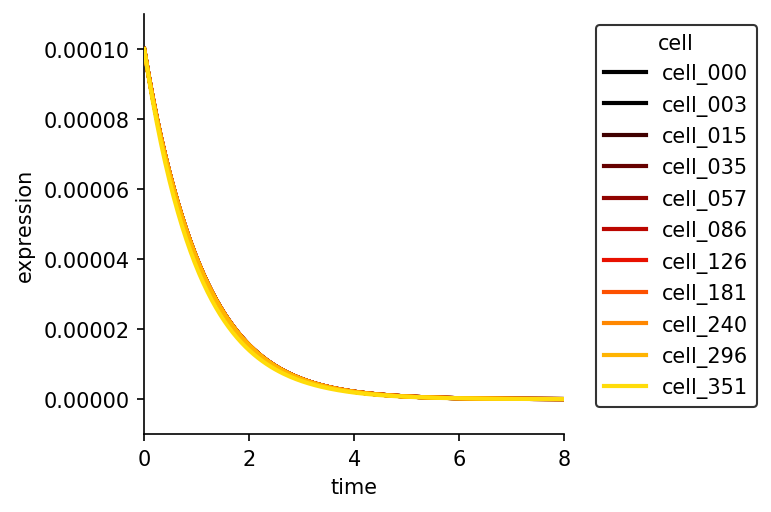

In [85]:
color_cycle = hv.Cycle(['black'] + cc.fire[::25])

plt = hv.Curve(
    data=data2d,
    kdims=['time'],
    vdims=["expression", "cell"]
).groupby(
    "cell"
).opts(
    hv.opts.Curve(color=color_cycle),
).overlay().opts(legend_position="right", )

hv.output(plt, dpi=150)

What if we add leakiness? Leakiness can be parameterized by a parameter `lambda_`

In [86]:
def rhs_tc_delay_cis_leak_2D_nosender(E, t, E_past, I_t, A, delays, params):

    tau = delays[0]
    alpha, k_s, p_s, delta, lambda_ = params

    # Get the signal input E_bar to each cell after a delay tau
    E_tau = E_past(t - tau)
    E_bar = np.dot(A, E_tau)

    # Evaluate Hill term
    f = E_bar ** p_s / (k_s ** p_s + (delta * E_tau) ** p_s + E_bar ** p_s)

    # Calculate change in expression
    dE_dt = lambda_ + alpha * f - E
    #     dE_dt[0, :] = I_t(t) - E[0, :]

    return dE_dt

In [87]:
alpha = 2
k_s = 0.1
p_s = 5
delta = 10
lambda_ = 0.01
tau = 0.4

params = alpha, k_s, p_s, delta, lambda_
delays = (tau,)

In [88]:
def E0(t, I_t, n_cells): 
    E = np.zeros((n_cells, 1)) + lambda_
#     E[0, :] = I_t(t)
    return E

In [89]:
t_results = np.linspace(0, 8, 200)

t_dense, E_dense, results = ddeint_2D(
    dde_rhs=rhs_tc_delay_cis_leak_2D_nosender,
    E0=E0,
    t_out=t_results,
    delays=delays,
    I_t=I_t,
    lattice=lax2d,
    dde_args=params,
    n_time_points_per_step=200,
    progress_bar=True,
)

100%|██████████| 20/20 [00:23<00:00,  1.20s/it]


In [90]:
axis_cells = np.argwhere((lax2d.X[:, 1] == 0) & (lax2d.X[:, 0] >= 0)).flatten()
n_axis_cells = axis_cells.size
axis_results = results[:, axis_cells, :]

data2d = pd.DataFrame(
    {
        "step": np.repeat(np.arange(t_results.size), axis_cells.size),
        "time": np.repeat(t_results, axis_cells.size),
        "cell": np.array(
            [
                "cell_" + str(i).zfill(3)
                for i in np.tile(axis_cells, t_results.size)
            ]
        ),
        "expression": axis_results.flatten(),
    }
)

In [91]:
axis_results[8, :, 0]

array([0.01000275, 0.01000275, 0.01000275, 0.01000275, 0.01000275,
       0.01000275, 0.01000275, 0.01000275, 0.01000275, 0.01000275,
       0.01000009])

:NdOverlay   [cell]
   :Curve   [time]   (expression,cell)
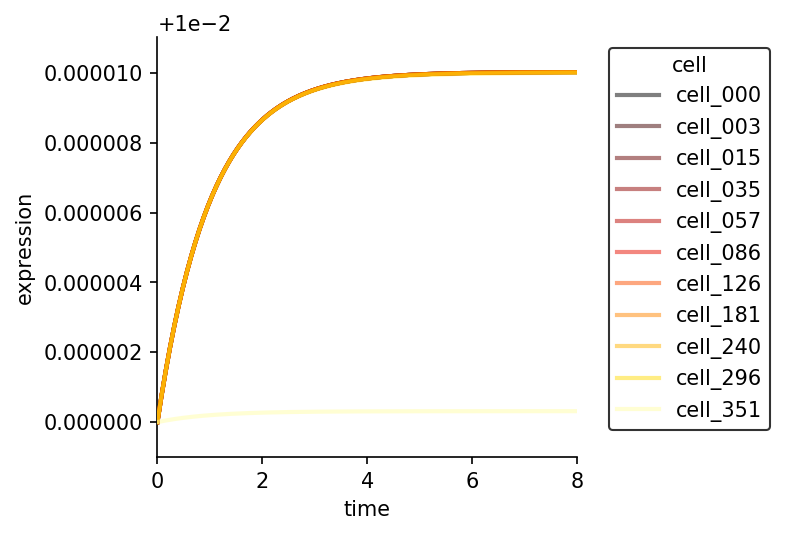

In [92]:
color_cycle = hv.Cycle(sample_cycle(cc.fire[:-5], n_axis_cells))

plt = hv.Curve(
    data=data2d,
    kdims=['time'],
    vdims=["expression", "cell"]
).groupby(
    "cell"
).opts(
    hv.opts.Curve(color=color_cycle, alpha=0.5),
).overlay().opts(legend_position="right", )

hv.output(plt, dpi=150)

With the addition of leakiness, the initial condition now significantly affects whether the system will self-activate in the absence of a sender.

In [93]:
def rhs_tc_delay_cis_leak_2D(E, t, E_past, I_t, A, delays, params):

    tau = delays[0]
    alpha, k_s, p_s, delta, lambda_ = params

    # Get the signal input E_bar to each cell after a delay tau
    E_tau = E_past(t - tau)
    E_bar = np.dot(A, E_tau)

    # Evaluate Hill term
    f = E_bar ** p_s / (k_s + (delta * E_tau) ** p_s + E_bar ** p_s)

    # Calculate change in expression
    dE_dt = lambda_ + alpha * f - E
    dE_dt[0, :] = I_t(t) - E[0, :]

    return dE_dt

In [94]:
alpha = 2
k_s = 0.1
p_s = 5
delta = 100
lambda_ = 0.01
tau = 0.5

params = alpha, k_s, p_s, delta, lambda_
delays = (tau,)

In [95]:
def E0(t, I_t, n_cells): 
    E = np.zeros((n_cells, 1)) + 1e-4
    E[0, :] = I_t(t)
    return E

In [96]:
t_results = np.linspace(0, 8, 200)

t_dense, E_dense, results = ddeint_2D(
    dde_rhs=rhs_tc_delay_cis_leak_2D,
    E0=E0,
    t_out=t_results,
    delays=delays,
    I_t=I_t,
    lattice=lax2d,
    dde_args=params,
    n_time_points_per_step=100,
    progress_bar=True,
)

100%|██████████| 16/16 [00:10<00:00,  1.51it/s]


In [97]:
axis_cells = np.argwhere((lax2d.X[:, 1] == 0) & (lax2d.X[:, 0] >= 0)).flatten()
n_axis_cells = axis_cells.size
axis_results = results[:, axis_cells, :]

data2d = pd.DataFrame(
    {
        "step": np.repeat(np.arange(t_results.size), axis_cells.size),
        "time": np.repeat(t_results, axis_cells.size),
        "cell": np.array(
            [
                "cell_" + str(i).zfill(3)
                for i in np.tile(axis_cells, t_results.size)
            ]
        ),
        "expression": axis_results.flatten(),
    }
)

:NdOverlay   [cell]
   :Curve   [time]   (expression,cell)
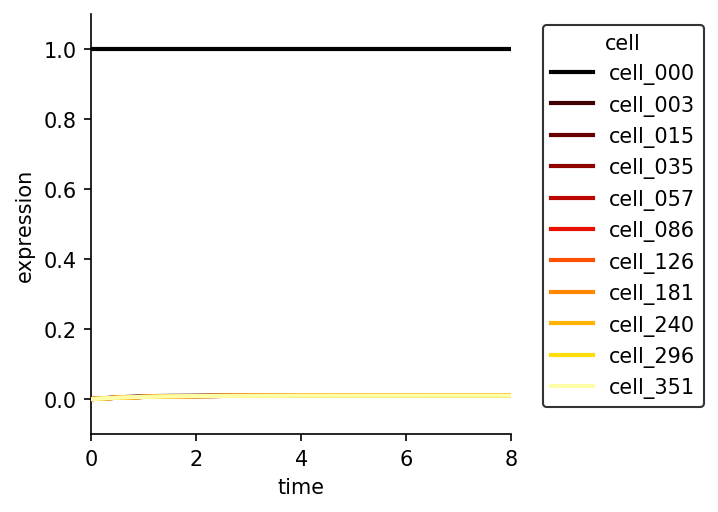

In [98]:
color_cycle = hv.Cycle(sample_cycle(cc.fire[:-5], n_axis_cells))

plt = hv.Curve(
    data=data2d,
    kdims=['time'],
    vdims=["expression", "cell"]
).groupby(
    "cell"
).opts(
    hv.opts.Curve(color=color_cycle),
).overlay().opts(legend_position="right", )

hv.output(plt, dpi=150)

<hr>

What are my behavior criteria/categories?

1) In the absence of sender, does the lattice self-activate? Is it "robust" to self-activation?

2) In the presence of sender, how does it behave?
- No activation (at SS, last cell is close to its no-sender steady state)
- Activation with or without "boosted" dynamics. Increases to a high steady state. Could be monotonic, overshoot, overdamped, oscillatory, etc.
- Imperfect activation (overshoot to middle steady-state)
- Pulsed activation (overshoot to low steady-state)

What are my plausible parameter ranges?

    alpha:   0.5   -    5.0 (lin-space)
    k_s:    1e-6   -   3e-1 (log-space)
    p_s:       1   -      5 (but 2 is fine)
    delta:     0   -     10 (technically, 0 to inf, but above 10, maybe diminishing returns)
    lambda:    0   -   2e-2 (must be much lower than $k_s$ to ensure bistability)
    tau:     0.0   -    0.7 (cell cycle time)

First, I want to see where the transceiver system is stable in the absence of senders. I'll sample the following parameters:

    alpha:   0.5 to 5 
    k_s:    1e-6 to 2e-1
    p_s:       2 
    delta:     0 (worst-case)
    lambda: 1e-7 to 2e-2 
    tau:     0.4 

    p_s:       2 
    tau:     0.4 


In [6]:
alpha_space = np.linspace(0.5, 5, 10)
k_s_space = np.logspace(-6.0, -0.6, 6)
p_s_space = 2
delta_space = 0
lambda_space = np.logspace(-7, -1.6, 6)
tau_space = 0.4

In [7]:
param_space = np.array(np.meshgrid(
    alpha_space, 
    k_s_space, 
    p_s_space,
    delta_space,
    lambda_space,
)).T.reshape(-1,5)

param_space

array([[5.00000000e-01, 1.00000000e-06, 2.00000000e+00, 0.00000000e+00,
        1.00000000e-07],
       [5.00000000e-01, 1.20226443e-05, 2.00000000e+00, 0.00000000e+00,
        1.00000000e-07],
       [5.00000000e-01, 1.44543977e-04, 2.00000000e+00, 0.00000000e+00,
        1.00000000e-07],
       ...,
       [5.00000000e+00, 1.73780083e-03, 2.00000000e+00, 0.00000000e+00,
        2.51188643e-02],
       [5.00000000e+00, 2.08929613e-02, 2.00000000e+00, 0.00000000e+00,
        2.51188643e-02],
       [5.00000000e+00, 2.51188643e-01, 2.00000000e+00, 0.00000000e+00,
        2.51188643e-02]])

In [8]:
def rhs_tc_delay_cis_leak_2D_nosender(E, t, E_past, I_t, A, delays, params):

    tau = delays[0]
    alpha, k_s, p_s, delta, lambda_ = params

    # Get the signal input E_bar to each cell after a delay tau
    E_tau = E_past(t - tau)
    E_bar = np.dot(A, E_tau)

    # Evaluate Hill term
    f = E_bar ** p_s / (k_s ** p_s + (delta * E_tau) ** p_s + E_bar ** p_s)

    # Calculate change in expression
    dE_dt = lambda_ + alpha * f - E
    #     dE_dt[0, :] = I_t(t) - E[0, :]

    return dE_dt

In [9]:
def E0(t, I_t, n_cells): 
    E = np.zeros((n_cells, 1), dtype=float)
#     E[0, :] = I_t(t)
    return E

In [10]:
lax2d = Regular2DLattice(R = 10)
t_results = np.linspace(0, 8, 201)

tau = 0.4
delays = (tau,)

axis_cells = np.argwhere((lax2d.X[:, 1] == 0) & (lax2d.X[:, 0] >= 0)).flatten()
n_axis_cells = axis_cells.size

In [110]:
results_list = []
iterator = tqdm.tqdm(param_space)

for params in iterator:
    
    # Enforce lambda > k_s
    if (params[4] * 10 > params[1]):
        continue
    
    t_dense, E_dense, results = ddeint_2D(
        dde_rhs=rhs_tc_delay_cis_leak_2D_nosender,
        E0=E0,
        t_out=t_results,
        delays=delays,
        I_t=I_t,
        lattice=lax2d,
        dde_args=params,
        n_time_points_per_step=100,
        progress_bar=False,
    )
    
    axis_results = results[:, axis_cells, :]
    
    results_list.append((params, axis_results))

100%|██████████| 360/360 [36:18<00:00,  6.05s/it] 


In [11]:
n_samples = len(results_list)
end_signals = np.array([result[-1, :, 0] for _, result in results_list])
sampled_param_space = np.array([p for p, _ in results_list])

NameError: name 'results_list' is not defined

In [150]:
param_names = ["alpha", "k_s", "p_s", "delta", "lambda"]
delay_names = ["tau"]
delays = (tau,)
species_names = ["expression"]

lax_data = pd.DataFrame(
    {
        "cell": np.array(
            [
                "cell_" + str(i).zfill(3)
                for i in np.tile(axis_cells, t_results.size)
            ]
        ),
        "X_coord": np.tile(np.arange(n_axis_cells), t_results.size),
        "step": np.repeat(np.arange(t_results.size), n_axis_cells),
        "time": np.repeat(t_results, n_axis_cells),
    }
)

In [151]:
dfs = []
run = 0
for params, result in results_list:
    
    param_data = lax_data.copy()
    result = result.reshape(-1, result.shape[-1]).T
    
    for sp, ex in zip(species_names, result):
        param_data[sp] = ex
    
    for p, v in zip(param_names, params):
        param_data[p] = v
    
    for d, v in zip(delay_names, delays):
        param_data[d] = v
        
    param_data["run"] = run
    
    dfs.append(pd.DataFrame(param_data))
    run += 1

In [152]:
df = pd.concat(dfs, axis=0)

In [12]:
# df.to_csv("2020-07-09_2D_delay_data/nosender_zs_cis_delay_leak.csv", )

In [13]:
# df = pd.read_csv("2020-07-09_2D_delay_data/nosender_zs_cis_delay_leak.csv", index_col=0)
# run_data = df.loc[(df["cell"] == "cell_000") & (df["step"] == 0), :]
# n_samples = run_data.shape[0]
# end_signals = df.loc[df["step"] == df["step"].max(), "expression"].values
# param_names = ["alpha", "k_s", "p_s", "delta", "lambda"]
# sampled_param_space = np.array(list(run_data.loc[:, param_names].itertuples(index=False, name=None)))

In [14]:
end_data = df.loc[df["step"] == df["step"].max(), :].copy()

In [15]:
end_data["norm. expression"] = end_data["expression"] / end_data["alpha"]
end_data["k_s / lambda"] = end_data["k_s"] / end_data["lambda"]
end_data["k_s / sqrt(lambda)"] = end_data["k_s"] / np.sqrt(end_data["lambda"])

In [16]:
plt = bokeh_catplot.ecdf(
    data=end_data,
    val="expression",
    cats=["cell"],
    width=600,
    height=600,
)
plt.legend.location = "bottom_right"

bokeh.io.show(plt)

In [17]:
plt = bokeh_catplot.ecdf(
    data=end_data,
    val="expression",
    cats=["alpha"],
    width=600,
    height=600,
)
plt.legend.location = "bottom_right"

bokeh.io.show(plt)

In [18]:
plt = bokeh_catplot.ecdf(
    data=end_data,
    val="norm. expression",
    cats=["alpha"],
    width=600,
    height=600,
)
plt.legend.location = "bottom_right"

bokeh.io.show(plt)

:NdLayout   [alpha]
   :Overlay
      .Points.I  :Points   [k_s,lambda]   (normalized expression,alpha)
      .Points.II :Points   [x,y]
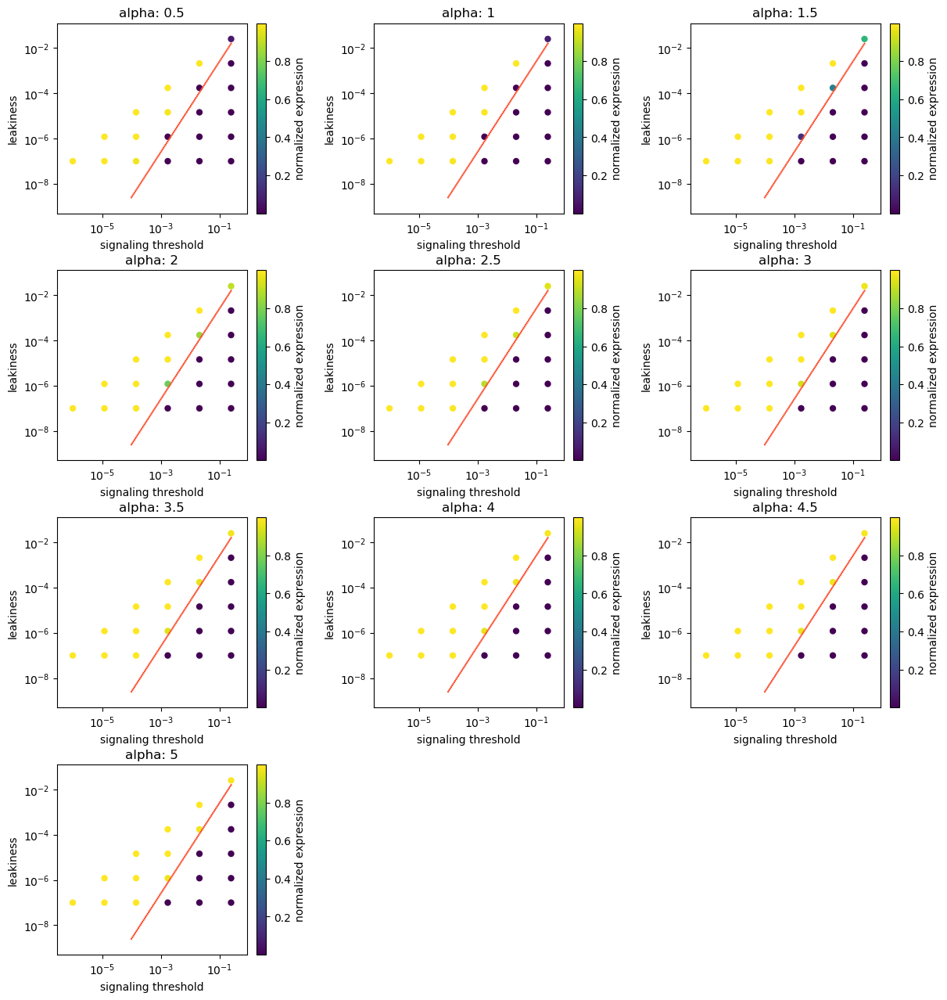

In [19]:
end_data["normalized expression"] = end_data["norm. expression"].values

plt = hv.Points(
#     data=end_data,
    data=end_data.loc[end_data["cell"] == "cell_"+str(axis_cells[0]).zfill(3), :],
    kdims=["k_s", "lambda"],
    vdims=["normalized expression", "alpha"]
).groupby(
    "alpha"
).opts(
    logx = True,
    logy = True,
    cmap = "viridis",
    color="normalized expression",
    colorbar = True,
    xlabel = "signaling threshold",
    ylabel = "leakiness",
    zlabel="steady state expression",
).layout().cols(3)

xx = np.logspace(-4, -0.6, 100)
yy = (xx / 2) ** 2
ff = np.array((xx, yy))
boundary = hv.Points(ff.T).opts(logx=True, logy=True, s=3)

hv.output(plt * boundary, dpi=100)

C:\Users\Pranav\Anaconda3\lib\site-packages\holoviews\plotting\mpl\element.py:775: UserWarning: aspect is not supported for Axes with xscale=log, yscale=linear
  fig.canvas.draw()
C:\Users\Pranav\Anaconda3\lib\site-packages\holoviews\plotting\mpl\element.py:776: UserWarning: aspect is not supported for Axes with xscale=log, yscale=linear
  bbox = axis.get_position()
C:\Users\Pranav\Anaconda3\lib\site-packages\holoviews\plotting\mpl\element.py:775: UserWarning: aspect is not supported for Axes with xscale=log, yscale=linear
  fig.canvas.draw()
C:\Users\Pranav\Anaconda3\lib\site-packages\holoviews\plotting\mpl\element.py:776: UserWarning: aspect is not supported for Axes with xscale=log, yscale=linear
  bbox = axis.get_position()
C:\Users\Pranav\Anaconda3\lib\site-packages\holoviews\plotting\mpl\element.py:775: UserWarning: aspect is not supported for Axes with xscale=log, yscale=linear
  fig.canvas.draw()
C:\Users\Pranav\Anaconda3\lib\site-packages\holoviews\plotting\mpl\element.py:776:

:NdLayout   [alpha]
   :Scatter   [k_s / sqrt(lambda)]   (norm. expression,alpha,cell)
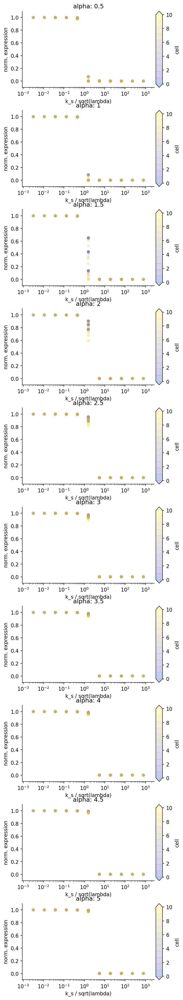

In [166]:
plt = hv.Scatter(
    data=end_data,
    kdims=["k_s / sqrt(lambda)"],
    vdims=["norm. expression", "alpha", "cell"]
).groupby(
    "alpha"
).opts(
    logx = True,
    cmap = cc.palette.bjy[::25],
    color="cell",
    colorbar = True,
    alpha=0.25
).layout().cols(1)

hv.output(plt, dpi=150)

There is a relationship here!! To guarantee a non-self-inducing lattice, we could enforce 

\begin{align}
\frac{k_s}{\sqrt\lambda} > 2
\end{align}

and to include all non-self-inducing lattices (while including some duds), we could enforce

\begin{align}
\frac{k_s}{\sqrt\lambda} > 1
\end{align}

I will take the first inequality. This is pretty restrictive - good, because it will help us restrict parameter search, but also not great because it suggests resrictions to design. I would like to re-run this for different values of delta, since that will help us understand how cis-inhibition could act as a design principle that helps patterning.

So now, let's return to our plausible parameter ranges

- $\alpha$ : 0.5 to 5 (lin-space?)
- $k_s$ : 1e-6 to 2e-1 (log-space)
- $p_s$ : 1 to 5 (but 2 is fine)
- $\delta$ : 0 to 10 (technically, 0 to inf, but above 10, maybe diminishing returns)
- $\lambda$ : 0 to 2e-2 ()
- $\tau$ : 0 to 0.7 (cell cycle time)

Now, I want to interrogate behavior in general. I'll fix the following parameters.

- $p_s$ : 2
- $\tau$ : 0.4

The free parameters will be:

- $\alpha$ : 0.5 to 5 (lin-space)
- $k_s$ : 1e-6 to 2e-1 (log-space)
- $\delta$ : 0 to 10 (linear)
- $\lambda$ : 1e-7 to 2e-2 (log-space-ish, must be much less than $k_s$)

I'll add the additional constraint: $\frac{k_s}{\sqrt\lambda} > 2$

In [196]:
alpha_space = np.linspace(0.5, 5, 10)
k_s_space = np.logspace(-5, -0.5, 10)
p_s_space = 2
delta_space = np.linspace(0, 5, 6)
lambda_space = np.logspace(-6, -1.5, 10)

In [197]:
param_space = np.array(np.meshgrid(
    alpha_space, 
    k_s_space, 
    p_s_space,
    delta_space,
    lambda_space,
)).T.reshape(-1,5)

param_space = param_space[(param_space[:, 1] / np.sqrt(param_space[:, 4]) > 2).nonzero()[0], :]

In [198]:
def rhs_tc_delay_cis_leak_2D(E, t, E_past, I_t, A, delays, params):

    tau = delays[0]
    alpha, k_s, p_s, delta, lambda_ = params

    # Get the signal input E_bar to each cell after a delay tau
    E_tau = E_past(t - tau)
    E_bar = np.dot(A, E_tau)

    # Evaluate Hill term
    f = E_bar ** p_s / (k_s ** p_s + (delta * E_tau) ** p_s + E_bar ** p_s)

    # Calculate change in expression
    dE_dt = lambda_ + alpha * f - E
    dE_dt[0, :] = I_t(t) - E[0, :]

    return dE_dt

In [199]:
def E0(t, I_t, n_cells): 
    E = np.zeros((n_cells, 1), dtype=float)
    E[0, :] = I_t(t)
    return E

In [200]:
lax2d = Regular2DLattice(R = 10)
t_results = np.linspace(0, 8, 201)

tau = 0.4
delays = (tau,)

axis_cells = np.argwhere((lax2d.X[:, 1] == 0) & (lax2d.X[:, 0] >= 0)).flatten()
n_axis_cells = axis_cells.size

In [ ]:
results_list = []
iterator = tqdm.tqdm(param_space)

for params in iterator:
    _, __, results = ddeint_2D(
        dde_rhs=rhs_tc_delay_cis_leak_2D_nosender,
        E0=E0,
        t_out=t_results,
        delays=delays,
        I_t=I_t,
        lattice=lax2d,
        dde_args=params,
        n_time_points_per_step=100,
        progress_bar=False,
    )
    
    axis_results = results[:, axis_cells, :]
    
    results_list.append((params, axis_results))

In [100]:
n_samples = len(results_list)
end_signals = np.array([result[-1, :, 0] for _, result in results_list])
sampled_param_space = np.array([p for p, _ in results_list])

In [234]:
dfs = []
param_names = ["alpha", "k_s", "p_s", "delta", "lambda"]
delay_names = ["tau"]
delays = (0.4,)
species_names = ["expression"]

lax_data = {
    "cell": np.array(
        [
            "cell_" + str(i).zfill(3)
            for i in np.tile(axis_cells, t_results.size)
        ]
    ),
    "X_coord": np.tile(np.arange(n_axis_cells), t_results.size),
    "step": np.repeat(np.arange(t_results.size), n_axis_cells),
    "time": np.repeat(t_results, n_axis_cells),
}

In [235]:
for params, result in results_list:
    
    param_data = lax_data.copy()
    result = result.reshape(-1, result.shape[-1])
    param_data.update({sp: ex for sp, ex in zip(species_names, result.T)})
    
    for p, v in zip(param_names, params):
        param_data[p] = v
    
    for d, v in zip(delay_names, delays):
        param_data[d] = v
    
    dfs.append(pd.DataFrame(param_data))

In [236]:
df = pd.concat(dfs)

In [238]:
# df.to_csv("2020-07-09_2D_delay_data/nosender_zs_cis_delay_leak.csv", )